In [1]:
import cv2
import numpy as np
import glob
import os
import pywt
import matplotlib.pyplot as plt

In [2]:
# Function for Wavelet Denoising
def wavelet_denoising(image, wavelet='db1', level=1):
    # Convert image to grayscale if needed
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    coeffs = pywt.wavedec2(image, wavelet, level=level)
    # Zeroing out all detail coefficients (you may want to modify this)
    coeffs_H = list(coeffs)
    coeffs_H[0] *= 1  # Instead of zeroing out, consider applying a threshold
    image_denoised = pywt.waverec2(coeffs_H, wavelet)
    image_denoised = np.clip(image_denoised, 0, 255).astype(np.uint8)
    return image_denoised

In [3]:
# Function for Adaptive Multi-Scale Retinex (AMSR)
def apply_amsr(image, scales=[150, 190, 110], scale_weights=[1.8, 2, 1.8], gain=50, offset=150):
    img_float = image.astype(np.float32) + 5.0
    retinex = np.zeros_like(img_float)
    for scale, weight in zip(scales, scale_weights):
        blur = cv2.GaussianBlur(img_float, (0, 0), scale)
        retinex += weight * (np.log10(img_float) - np.log10(blur + 1.0))
    retinex = gain * retinex + offset
    retinex = np.clip(retinex, 0, 255).astype(np.uint8)
    return retinex

In [4]:
# Function to compute PSNR
def calculate_psnr(original, processed):
    mse = np.mean((original.astype(np.float32) - processed.astype(np.float32)) ** 2)
    if mse == 0:
        return float('inf')
    psnr = 20 * np.log10(255.0 / np.sqrt(mse))
    return psnr

In [11]:
# Function to display images in 3 columns
def display_images_3col(original, wavelet, wavelet_amsr, title1, title2):
    plt.figure(figsize=(15, 5))
    
    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    # Wavelet Denoising Image
    plt.subplot(1, 3, 2)
    plt.imshow(wavelet, cmap='gray')  # Ensure grayscale visualization
    plt.title(title1)
    plt.axis('off')
    
    # Wavelet Denoising + AMSR Image
    plt.subplot(1, 3, 3)
    plt.imshow(wavelet_amsr, cmap='gray')  # Ensure grayscale visualization
    plt.title(title2)
    plt.axis('off')
    
    plt.show()

In [6]:
# Direktori gambar dan output
input_dir = 'C:/kuliah/semester 7/datmin/perbaikan citra/data/'
output_dir = 'C:/kuliah/semester 7/datmin/perbaikan citra/output/'

In [7]:
# Membuat direktori output jika belum ada
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

PSNR for COVID-01.png (Wavelet Denoising): 31.76 dB
PSNR for COVID-01.png (AMSR): 20.48 dB


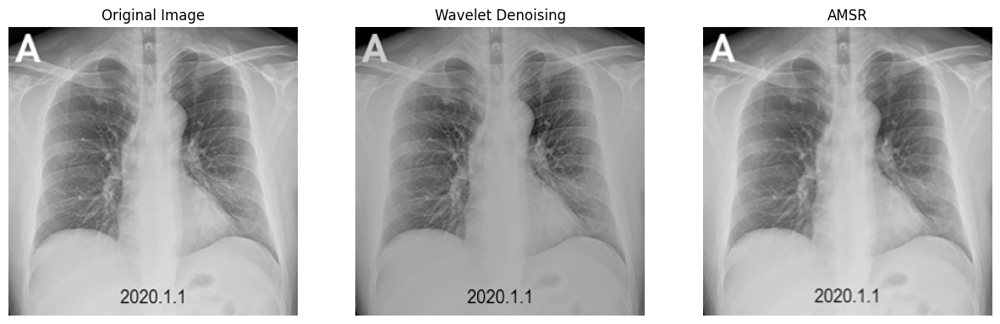

PSNR for COVID-02.png (Wavelet Denoising): 36.42 dB
PSNR for COVID-02.png (AMSR): 21.79 dB


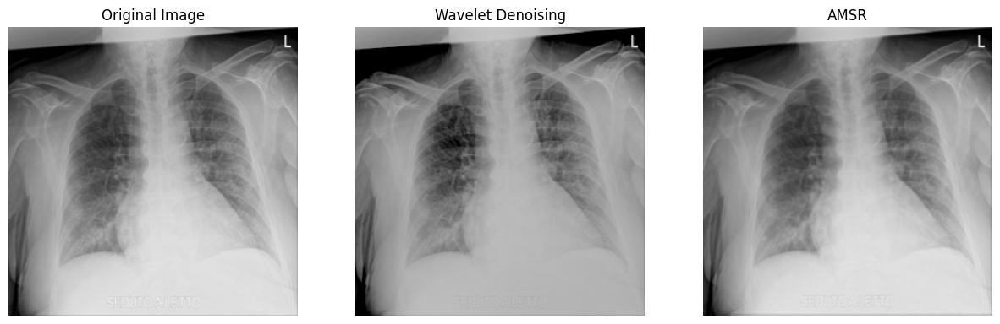

PSNR for COVID-03.png (Wavelet Denoising): 38.33 dB
PSNR for COVID-03.png (AMSR): 23.39 dB


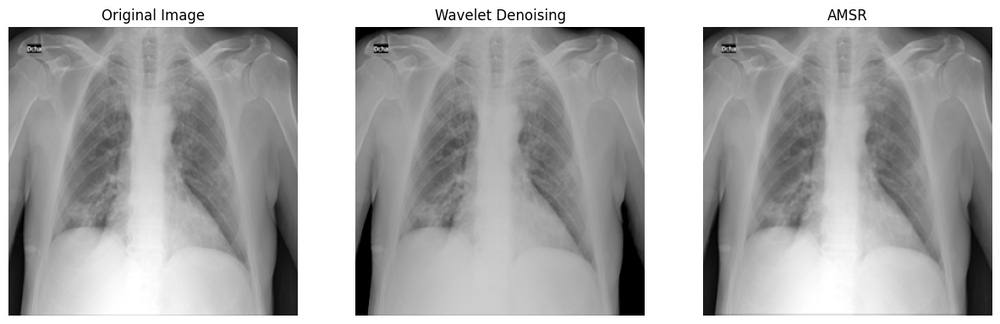

PSNR for COVID-04.png (Wavelet Denoising): 32.19 dB
PSNR for COVID-04.png (AMSR): 22.28 dB


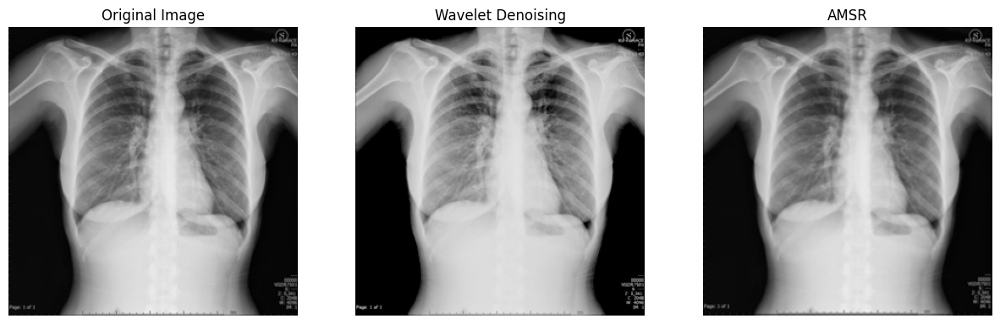

PSNR for COVID-05.png (Wavelet Denoising): 34.27 dB
PSNR for COVID-05.png (AMSR): 22.40 dB


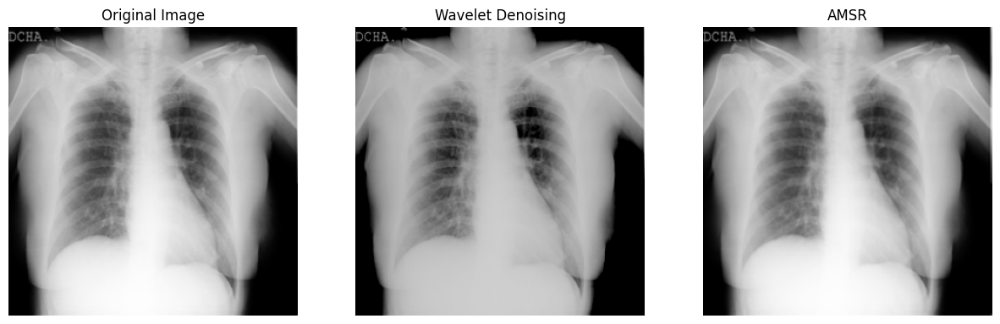

PSNR for COVID-06.png (Wavelet Denoising): 30.78 dB
PSNR for COVID-06.png (AMSR): 22.99 dB


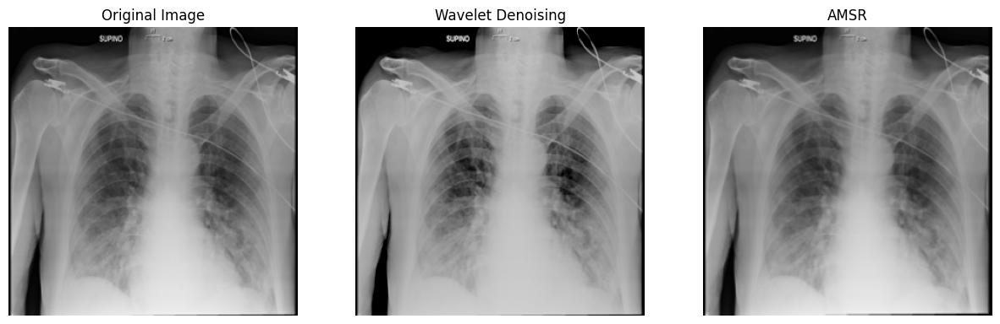

PSNR for COVID-07.png (Wavelet Denoising): 37.59 dB
PSNR for COVID-07.png (AMSR): 25.90 dB


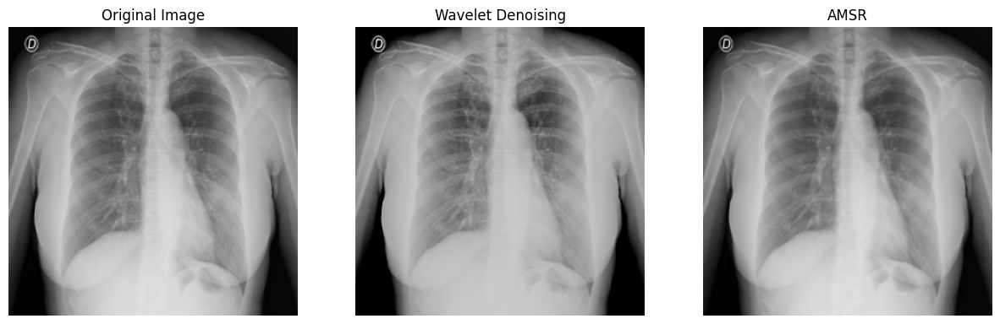

PSNR for COVID-08.png (Wavelet Denoising): 38.62 dB
PSNR for COVID-08.png (AMSR): 25.00 dB


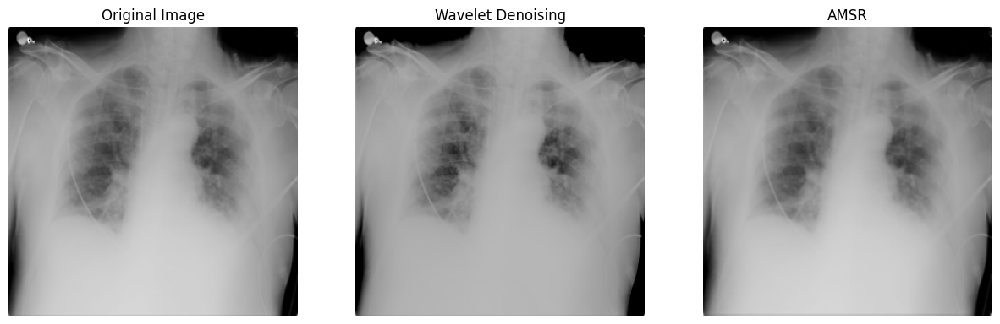

PSNR for COVID-09.png (Wavelet Denoising): 30.78 dB
PSNR for COVID-09.png (AMSR): 28.05 dB


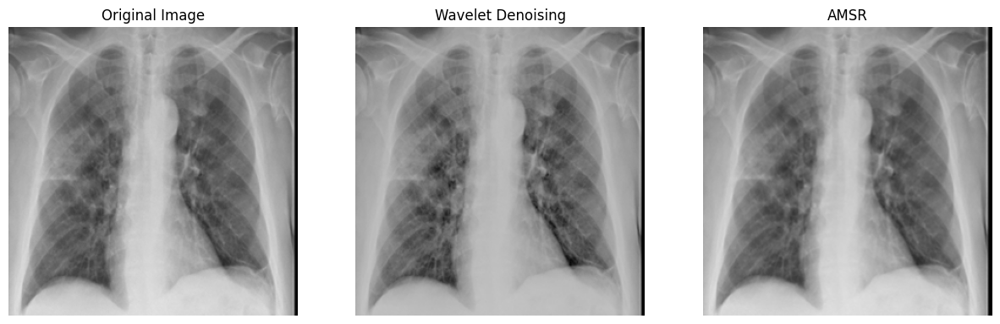

PSNR for COVID-10.png (Wavelet Denoising): 33.49 dB
PSNR for COVID-10.png (AMSR): 20.40 dB


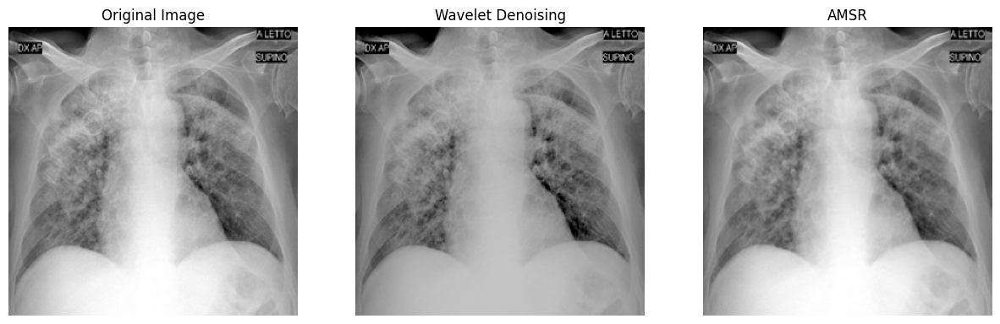

PSNR for Normal-01.png (Wavelet Denoising): 36.19 dB
PSNR for Normal-01.png (AMSR): 23.42 dB


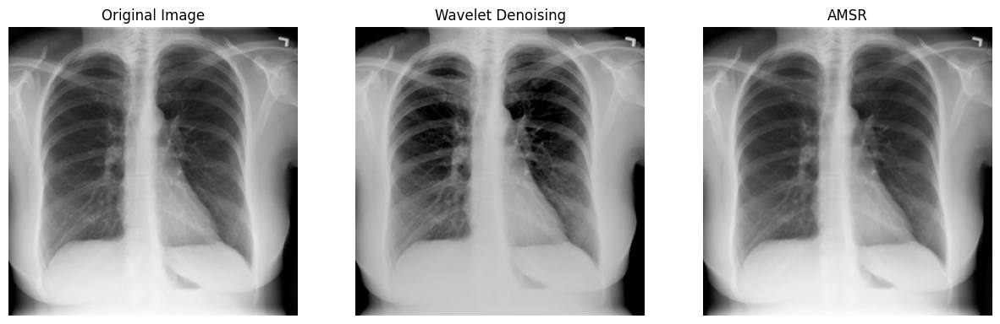

PSNR for Normal-02.png (Wavelet Denoising): 37.27 dB
PSNR for Normal-02.png (AMSR): 21.95 dB


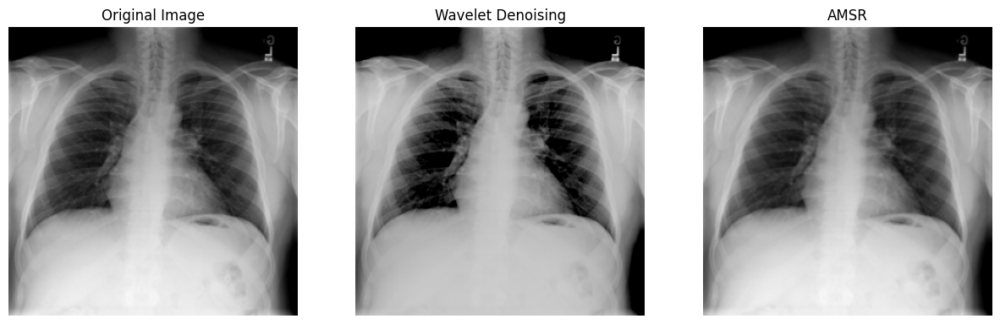

PSNR for Normal-03.png (Wavelet Denoising): 36.70 dB
PSNR for Normal-03.png (AMSR): 18.65 dB


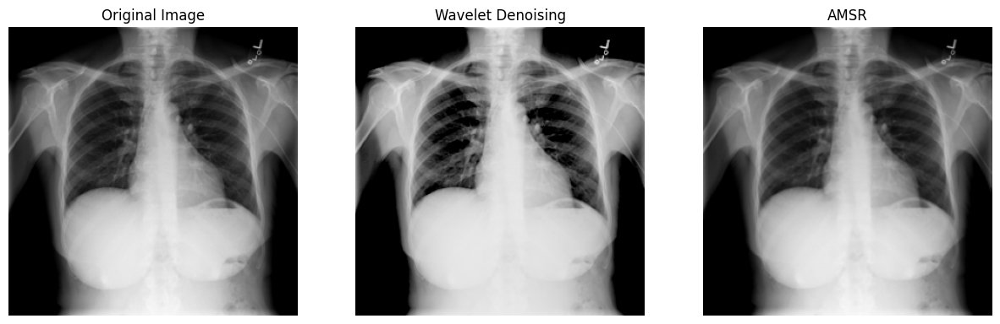

PSNR for Normal-04.png (Wavelet Denoising): 36.90 dB
PSNR for Normal-04.png (AMSR): 23.30 dB


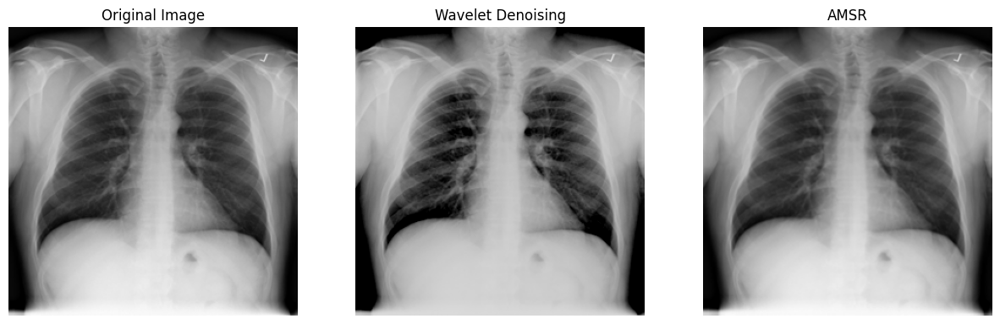

PSNR for Normal-05.png (Wavelet Denoising): 36.07 dB
PSNR for Normal-05.png (AMSR): 21.14 dB


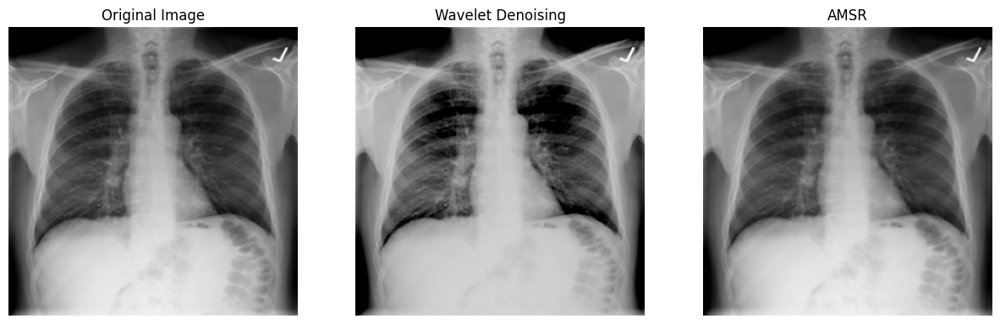

PSNR for Normal-06.png (Wavelet Denoising): 37.26 dB
PSNR for Normal-06.png (AMSR): 20.50 dB


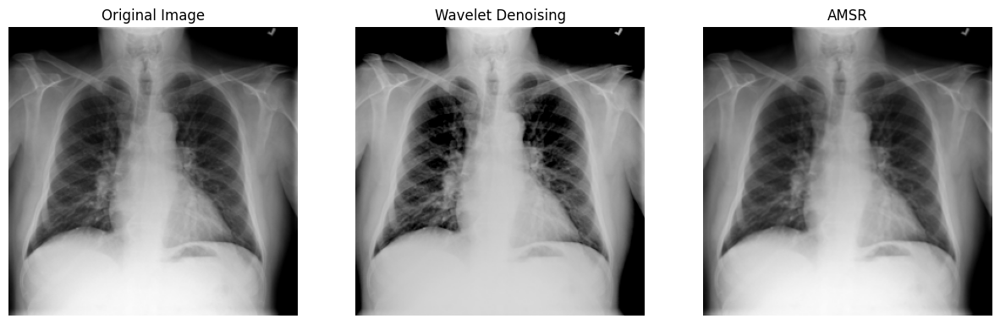

PSNR for Normal-07.png (Wavelet Denoising): 36.16 dB
PSNR for Normal-07.png (AMSR): 21.84 dB


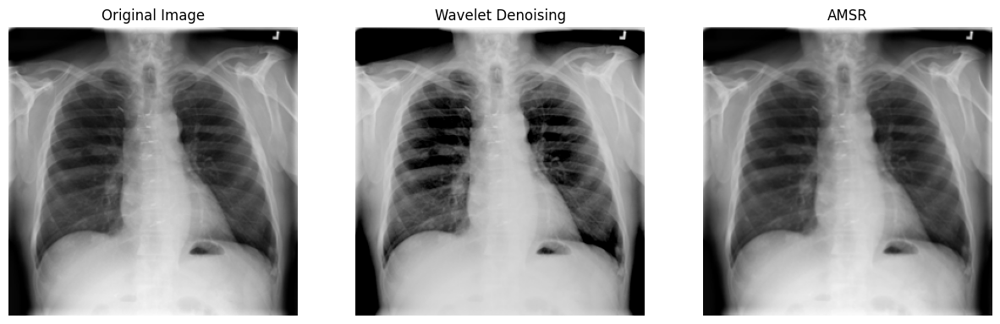

PSNR for Normal-08.png (Wavelet Denoising): 39.20 dB
PSNR for Normal-08.png (AMSR): 20.77 dB


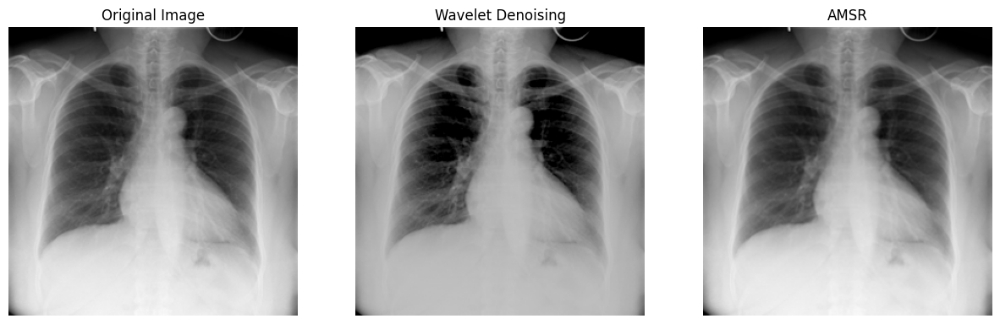

PSNR for Normal-09.png (Wavelet Denoising): 36.61 dB
PSNR for Normal-09.png (AMSR): 17.74 dB


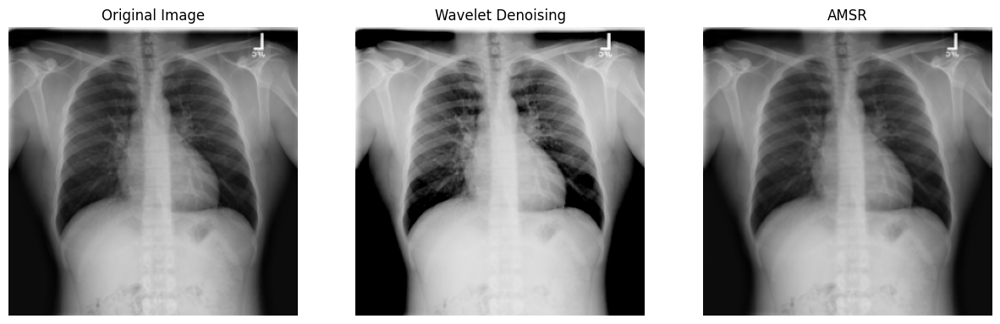

PSNR for Normal-20.png (Wavelet Denoising): 34.87 dB
PSNR for Normal-20.png (AMSR): 19.88 dB


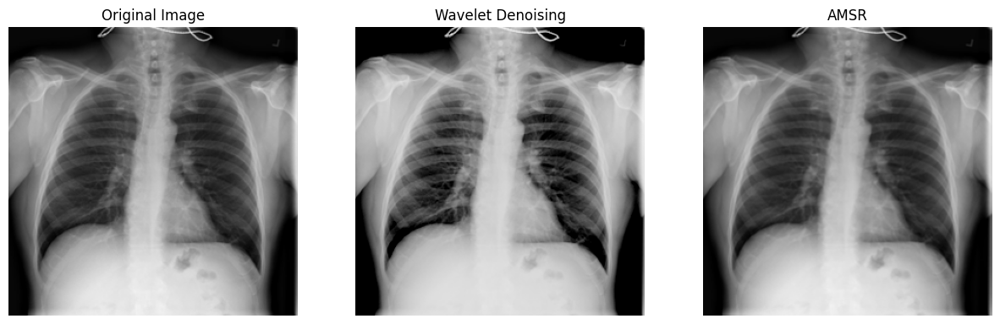

In [12]:
# Memproses setiap gambar dalam direktori
for image_path in glob.glob(os.path.join(input_dir, '*.png')):  # atau '*.png' sesuai dengan ekstensi file Anda
    # Membaca gambar
    image = cv2.imread(image_path)

    # Terapkan Wavelet Denoising
    image_wavelet = wavelet_denoising(image)

    # Terapkan AMSR langsung ke gambar asli
    image_amsr = apply_amsr(image)

    # Resize processed images to match original image size
    image_wavelet = cv2.resize(image_wavelet, (image.shape[1], image.shape[0]))
    image_amsr = cv2.resize(image_amsr, (image.shape[1], image.shape[0]))

    # Convert processed images to RGB to match the original image shape, only if they are not already in BGR format
    if len(image_wavelet.shape) == 2:  # Check if the image is grayscale
        image_wavelet = cv2.cvtColor(image_wavelet, cv2.COLOR_GRAY2BGR)
    if len(image_amsr.shape) == 2:  # Check if the image is grayscale
        image_amsr = cv2.cvtColor(image_amsr, cv2.COLOR_GRAY2BGR)

    # Menyimpan hasil gambar
    base_name = os.path.basename(image_path)
    wavelet_path = os.path.join(output_dir, f'wavelet_{base_name}')
    amsr_path = os.path.join(output_dir, f'amsr_{base_name}')

    cv2.imwrite(wavelet_path, image_wavelet)
    cv2.imwrite(amsr_path, image_amsr)

    # Hitung PSNR
    psnr_wavelet = calculate_psnr(image, image_wavelet)
    psnr_amsr = calculate_psnr(image, image_amsr)

    # Tampilkan PSNR
    print(f'PSNR for {base_name} (Wavelet Denoising): {psnr_wavelet:.2f} dB')
    print(f'PSNR for {base_name} (AMSR): {psnr_amsr:.2f} dB')
    
    # Tampilkan gambar dengan urutan yang diubah (Original, AMSR, Wavelet Denoising)
    display_images_3col(image, image_amsr, image_wavelet, title1='Wavelet Denoising', title2='AMSR')

PSNR for COVID-01.png (Wavelet Denoising): 31.76 dB
PSNR for COVID-01.png (Wavelet Denoising + AMSR): 20.15 dB


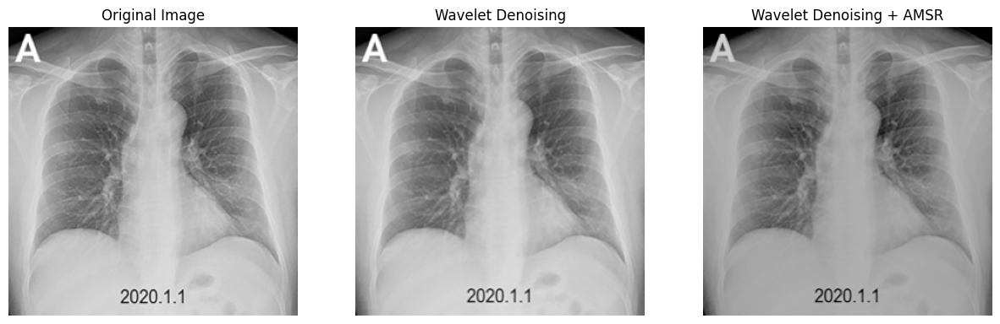

PSNR for COVID-02.png (Wavelet Denoising): 36.42 dB
PSNR for COVID-02.png (Wavelet Denoising + AMSR): 21.61 dB


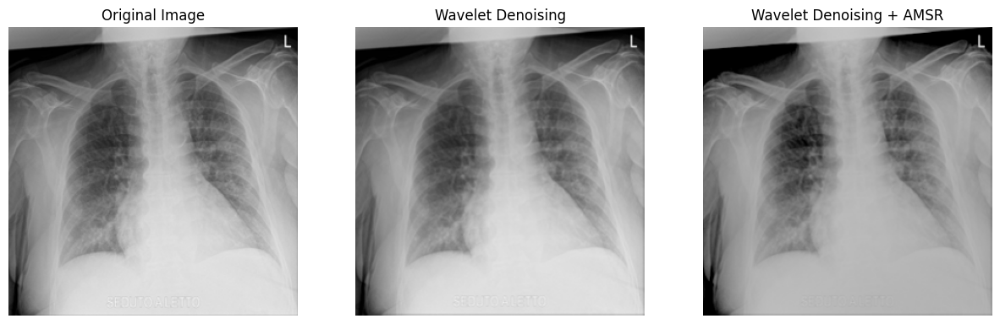

PSNR for COVID-03.png (Wavelet Denoising): 38.33 dB
PSNR for COVID-03.png (Wavelet Denoising + AMSR): 23.22 dB


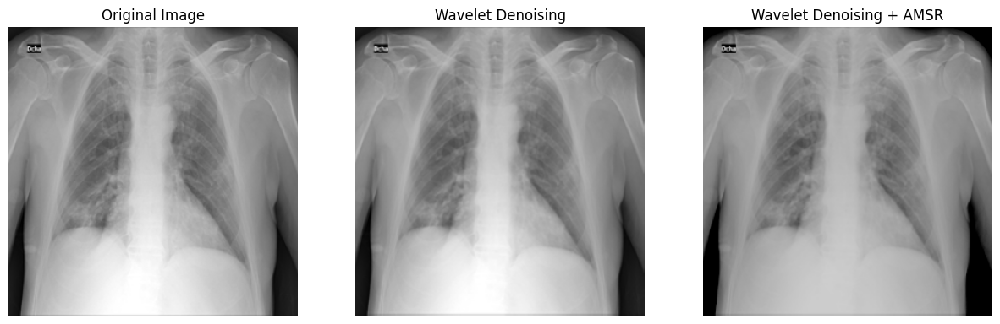

PSNR for COVID-04.png (Wavelet Denoising): 32.19 dB
PSNR for COVID-04.png (Wavelet Denoising + AMSR): 21.88 dB


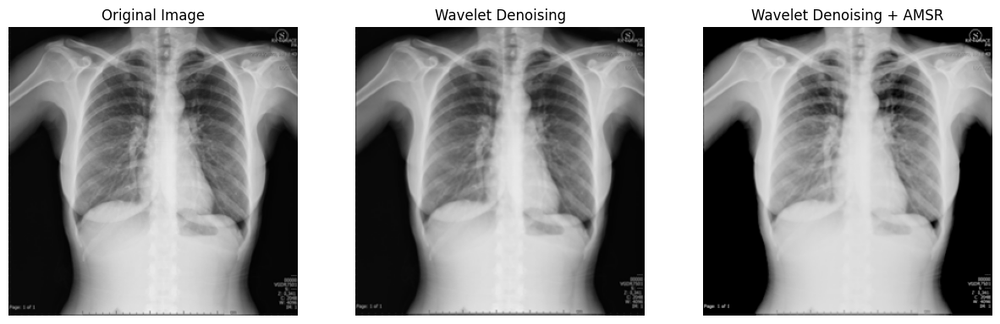

PSNR for COVID-05.png (Wavelet Denoising): 34.27 dB
PSNR for COVID-05.png (Wavelet Denoising + AMSR): 22.11 dB


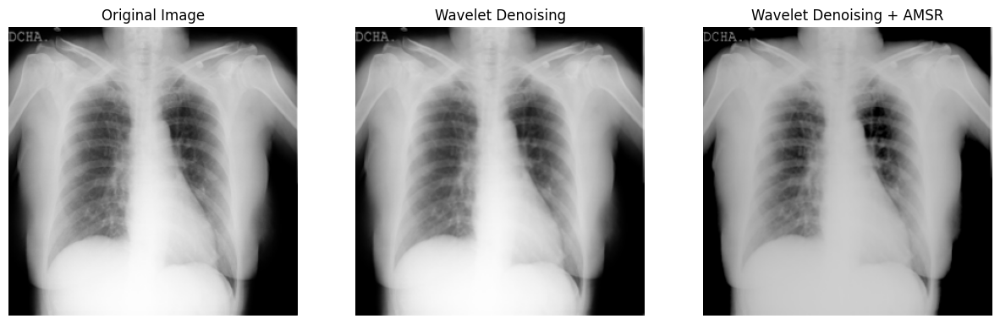

PSNR for COVID-06.png (Wavelet Denoising): 30.78 dB
PSNR for COVID-06.png (Wavelet Denoising + AMSR): 22.22 dB


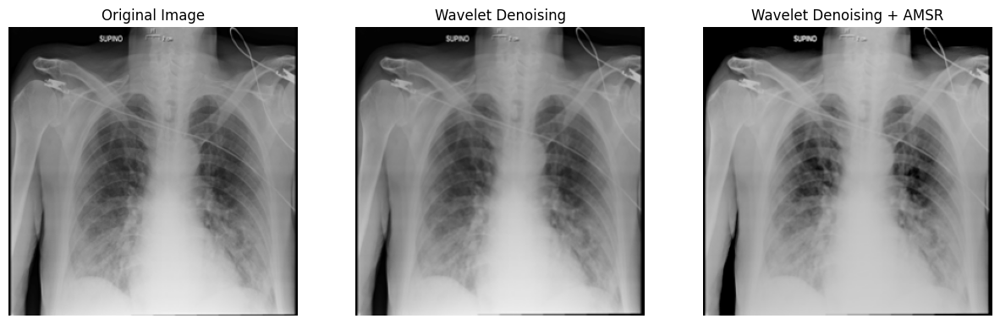

PSNR for COVID-07.png (Wavelet Denoising): 37.59 dB
PSNR for COVID-07.png (Wavelet Denoising + AMSR): 25.63 dB


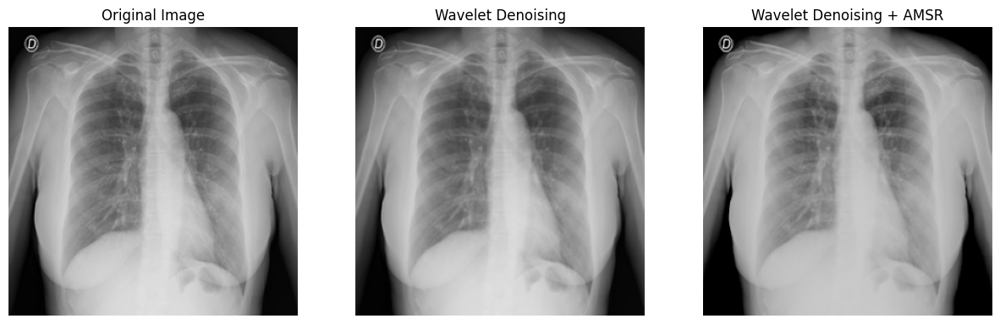

PSNR for COVID-08.png (Wavelet Denoising): 38.62 dB
PSNR for COVID-08.png (Wavelet Denoising + AMSR): 24.78 dB


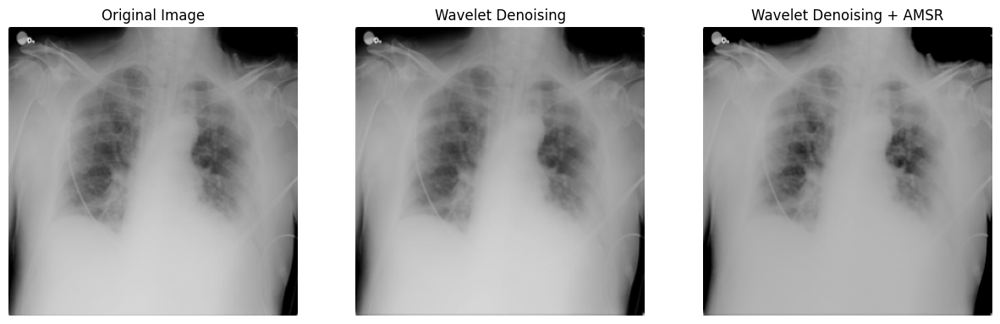

PSNR for COVID-09.png (Wavelet Denoising): 30.78 dB
PSNR for COVID-09.png (Wavelet Denoising + AMSR): 26.18 dB


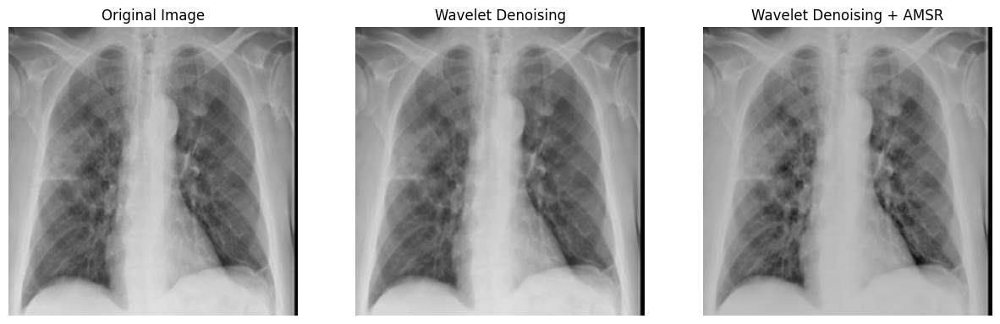

PSNR for COVID-10.png (Wavelet Denoising): 33.49 dB
PSNR for COVID-10.png (Wavelet Denoising + AMSR): 20.17 dB


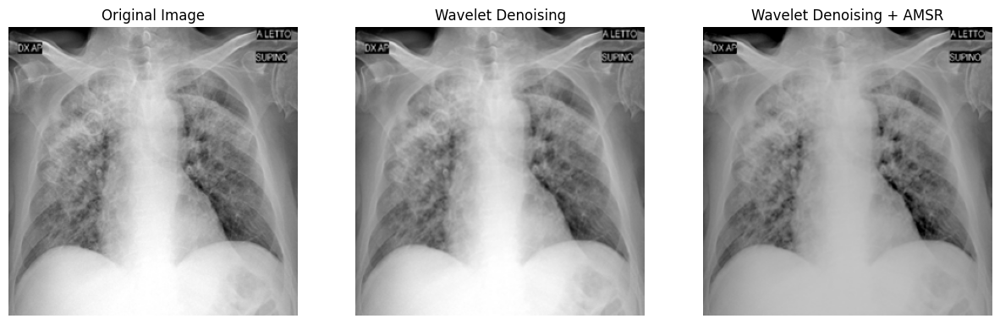

PSNR for Normal-01.png (Wavelet Denoising): 36.19 dB
PSNR for Normal-01.png (Wavelet Denoising + AMSR): 23.19 dB


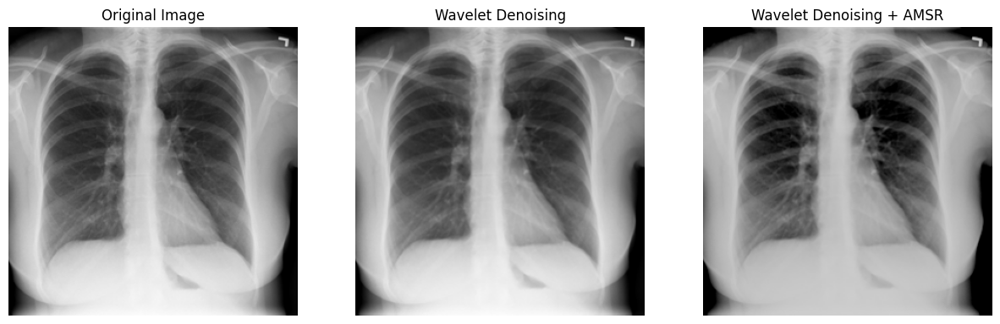

PSNR for Normal-02.png (Wavelet Denoising): 37.27 dB
PSNR for Normal-02.png (Wavelet Denoising + AMSR): 21.81 dB


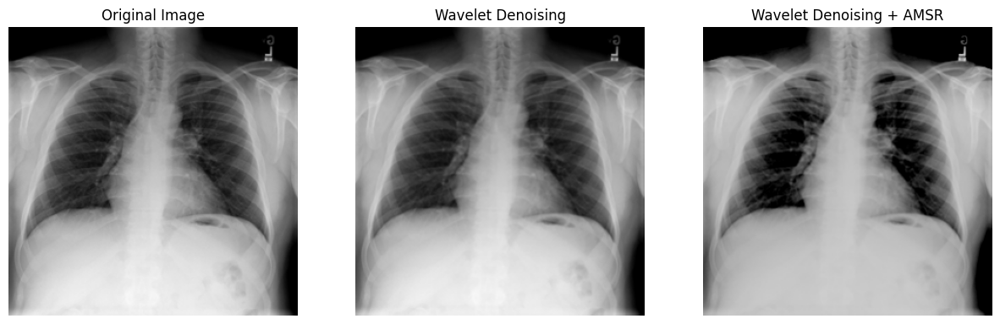

PSNR for Normal-03.png (Wavelet Denoising): 36.70 dB
PSNR for Normal-03.png (Wavelet Denoising + AMSR): 18.61 dB


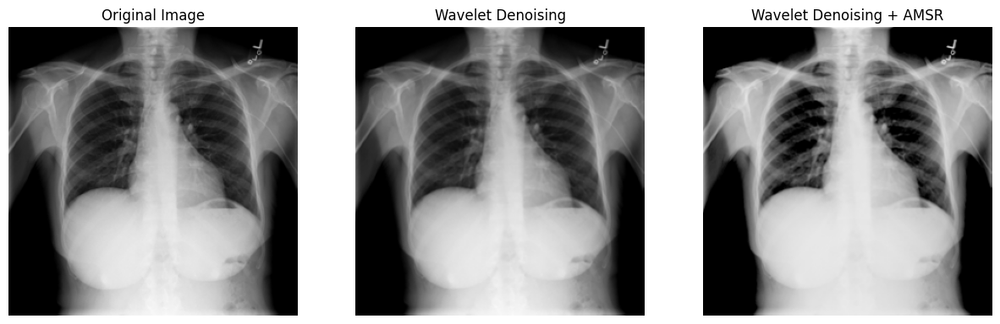

PSNR for Normal-04.png (Wavelet Denoising): 36.90 dB
PSNR for Normal-04.png (Wavelet Denoising + AMSR): 23.16 dB


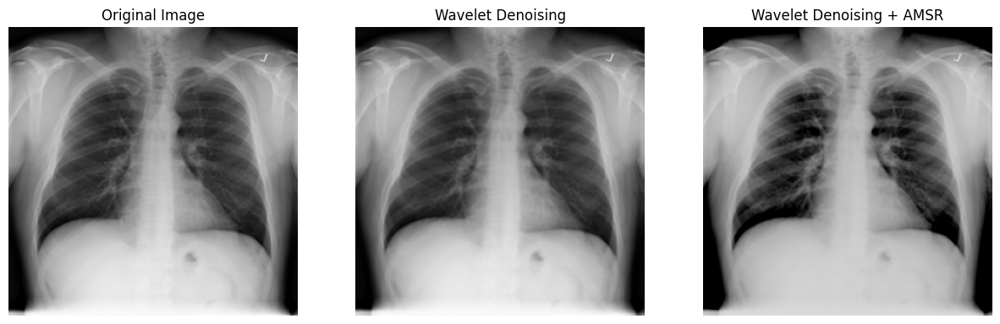

PSNR for Normal-05.png (Wavelet Denoising): 36.07 dB
PSNR for Normal-05.png (Wavelet Denoising + AMSR): 21.03 dB


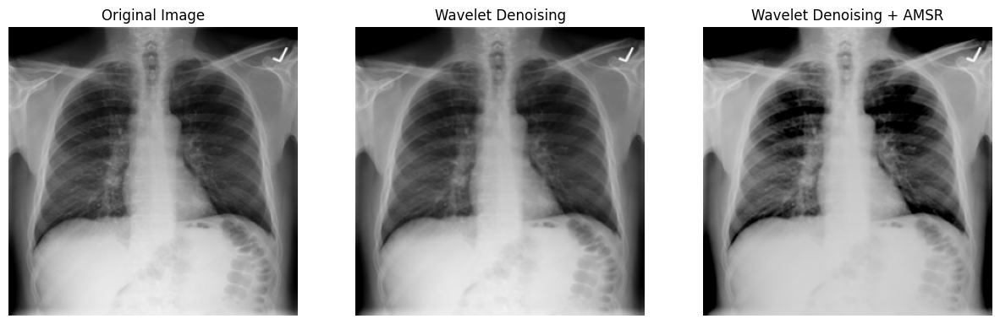

PSNR for Normal-06.png (Wavelet Denoising): 37.26 dB
PSNR for Normal-06.png (Wavelet Denoising + AMSR): 20.41 dB


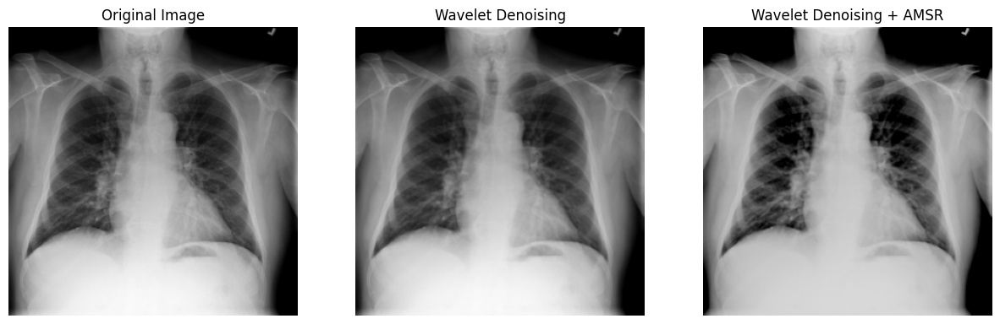

PSNR for Normal-07.png (Wavelet Denoising): 36.16 dB
PSNR for Normal-07.png (Wavelet Denoising + AMSR): 21.71 dB


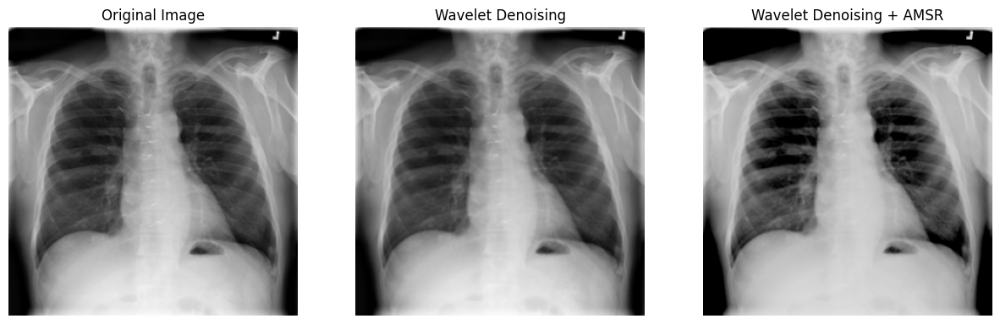

PSNR for Normal-08.png (Wavelet Denoising): 39.20 dB
PSNR for Normal-08.png (Wavelet Denoising + AMSR): 20.68 dB


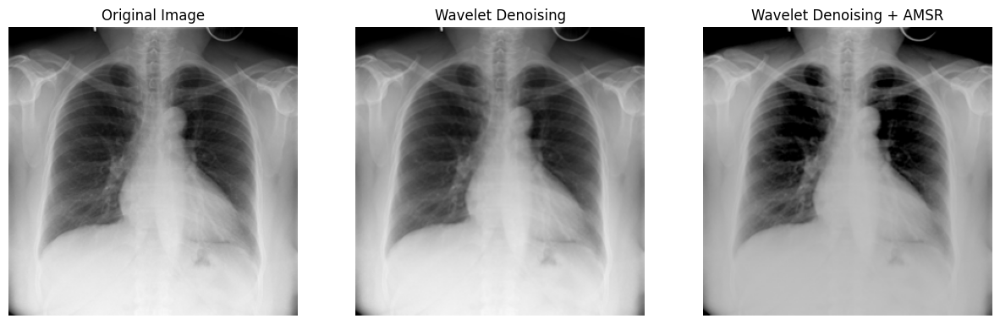

PSNR for Normal-09.png (Wavelet Denoising): 36.61 dB
PSNR for Normal-09.png (Wavelet Denoising + AMSR): 17.71 dB


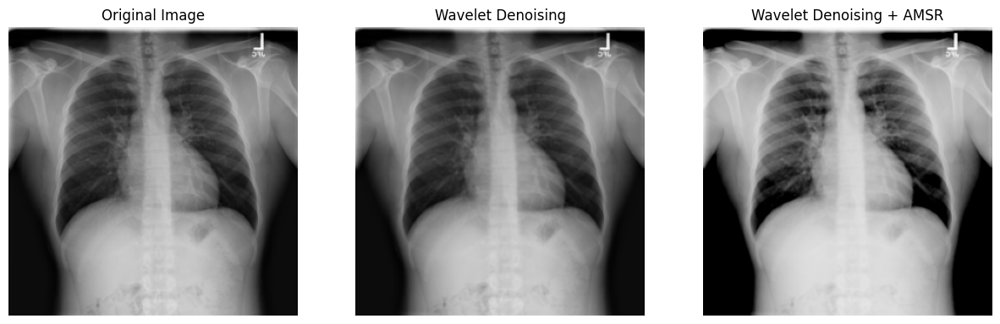

PSNR for Normal-20.png (Wavelet Denoising): 34.87 dB
PSNR for Normal-20.png (Wavelet Denoising + AMSR): 19.78 dB


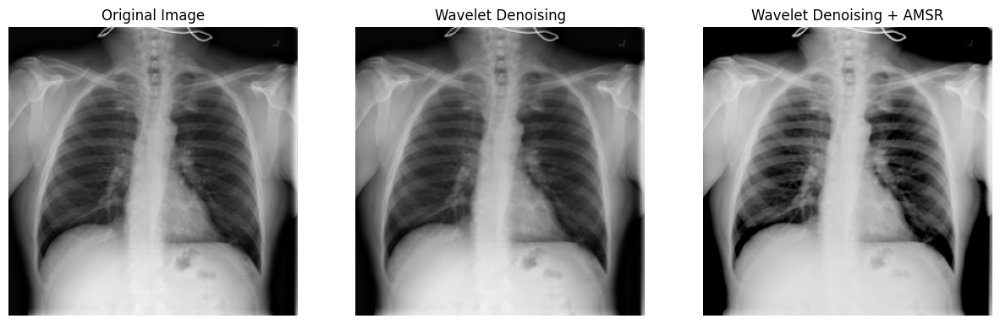

In [13]:
# Memproses setiap gambar dalam direktori
for image_path in glob.glob(os.path.join(input_dir, '*.png')):  # atau '*.png' sesuai dengan ekstensi file Anda
    # Membaca gambar
    image = cv2.imread(image_path)

    # Terapkan Wavelet Denoising
    image_wavelet = wavelet_denoising(image)

    # Terapkan AMSR setelah Wavelet Denoising
    image_wavelet_amsr = apply_amsr(image_wavelet)

    # Resize processed images to match original image size
    image_wavelet = cv2.resize(image_wavelet, (image.shape[1], image.shape[0]))
    image_wavelet_amsr = cv2.resize(image_wavelet_amsr, (image.shape[1], image.shape[0]))

    # Convert processed images to RGB to match the original image shape
    image_wavelet = cv2.cvtColor(image_wavelet, cv2.COLOR_GRAY2BGR)
    image_wavelet_amsr = cv2.cvtColor(image_wavelet_amsr, cv2.COLOR_GRAY2BGR)

    # Menyimpan hasil gambar
    base_name = os.path.basename(image_path)
    wavelet_path = os.path.join(output_dir, f'wavelet1_{base_name}')
    amsr_path = os.path.join(output_dir, f'wavelet_amsr_{base_name}')

    cv2.imwrite(wavelet_path, image_wavelet)
    cv2.imwrite(amsr_path, image_wavelet_amsr)

    # Hitung PSNR
    psnr_wavelet = calculate_psnr(image, image_wavelet)
    psnr_wavelet_amsr = calculate_psnr(image, image_wavelet_amsr)

    # Tampilkan PSNR
    print(f'PSNR for {base_name} (Wavelet Denoising): {psnr_wavelet:.2f} dB')
    print(f'PSNR for {base_name} (Wavelet Denoising + AMSR): {psnr_wavelet_amsr:.2f} dB')
    
    # Tampilkan gambar
    display_images_3col(image, image_wavelet, image_wavelet_amsr, title1='Wavelet Denoising', title2='Wavelet Denoising + AMSR')

PSNR for COVID-01.png (AMSR): 20.48 dB
PSNR for COVID-01.png (AMSR + Wavelet Denoising): 20.15 dB


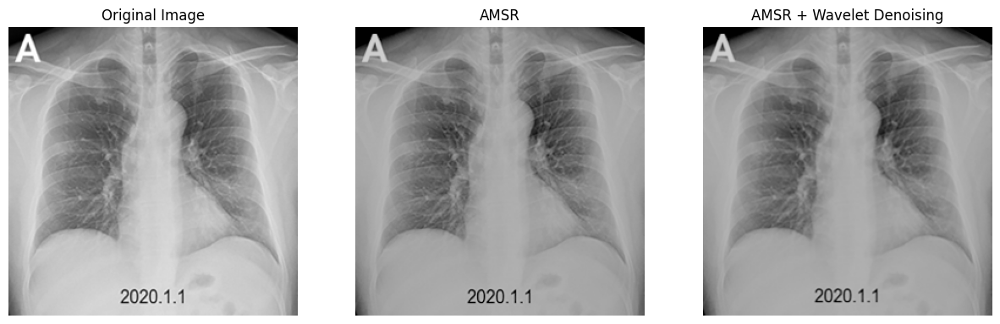

PSNR for COVID-02.png (AMSR): 21.79 dB
PSNR for COVID-02.png (AMSR + Wavelet Denoising): 21.61 dB


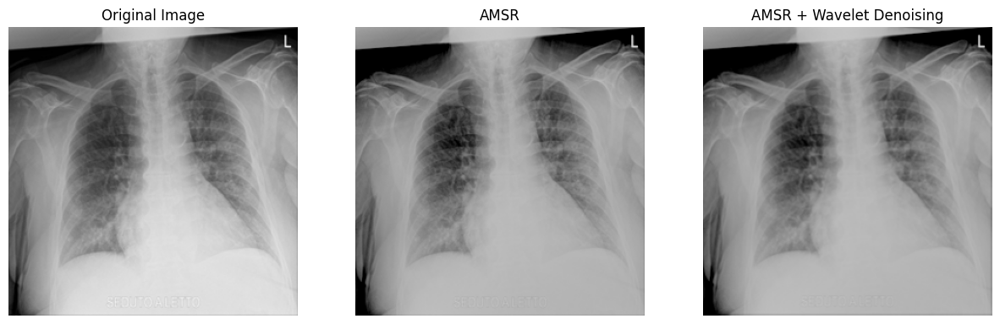

PSNR for COVID-03.png (AMSR): 23.39 dB
PSNR for COVID-03.png (AMSR + Wavelet Denoising): 23.20 dB


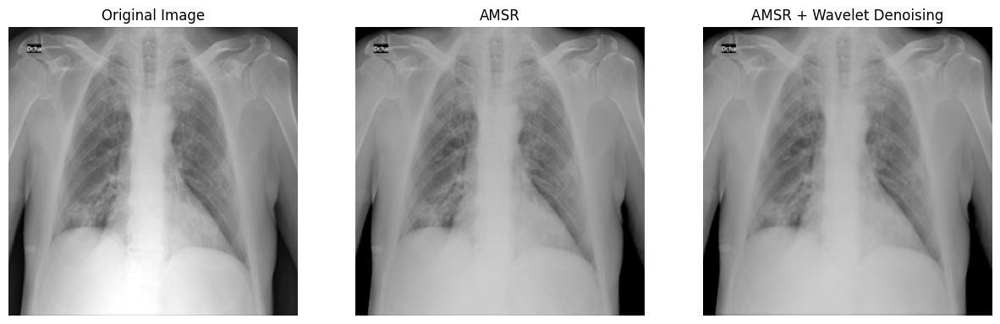

PSNR for COVID-04.png (AMSR): 22.28 dB
PSNR for COVID-04.png (AMSR + Wavelet Denoising): 22.00 dB


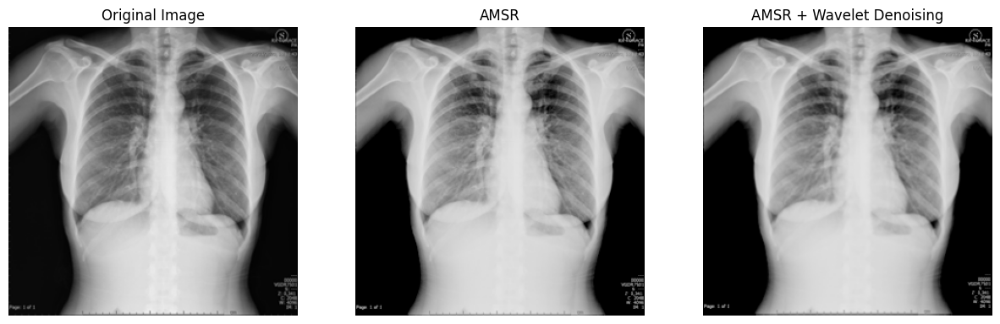

PSNR for COVID-05.png (AMSR): 22.40 dB
PSNR for COVID-05.png (AMSR + Wavelet Denoising): 22.08 dB


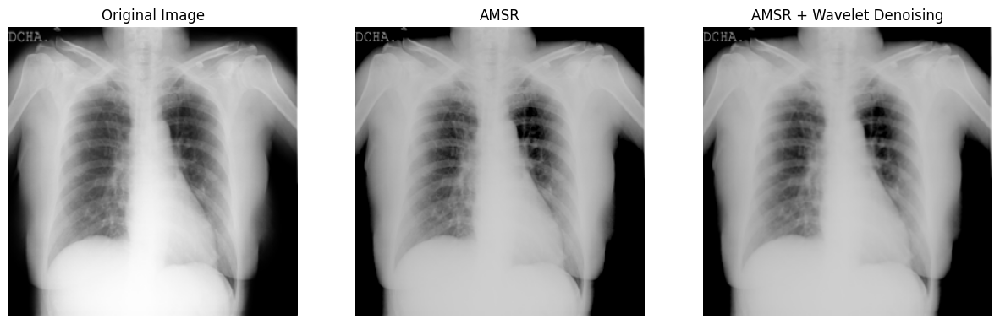

PSNR for COVID-06.png (AMSR): 22.99 dB
PSNR for COVID-06.png (AMSR + Wavelet Denoising): 22.31 dB


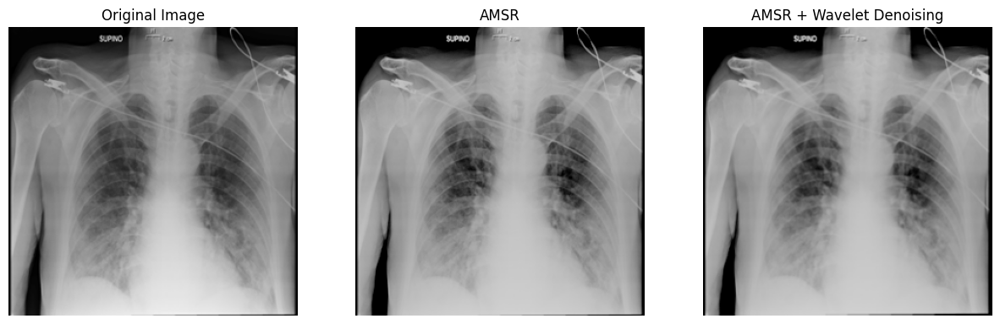

PSNR for COVID-07.png (AMSR): 25.90 dB
PSNR for COVID-07.png (AMSR + Wavelet Denoising): 25.67 dB


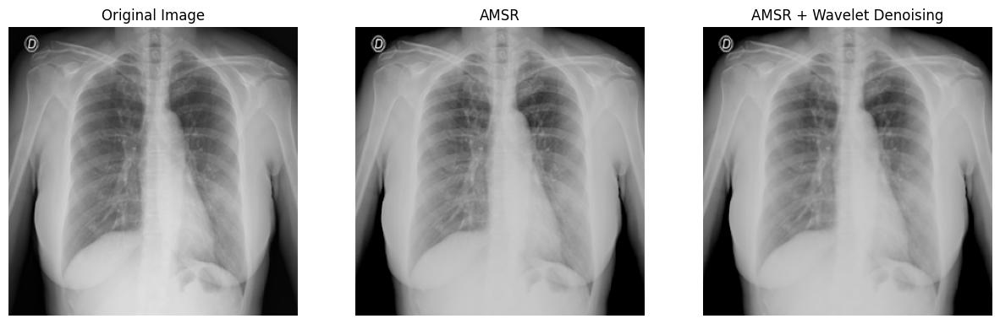

PSNR for COVID-08.png (AMSR): 25.00 dB
PSNR for COVID-08.png (AMSR + Wavelet Denoising): 24.76 dB


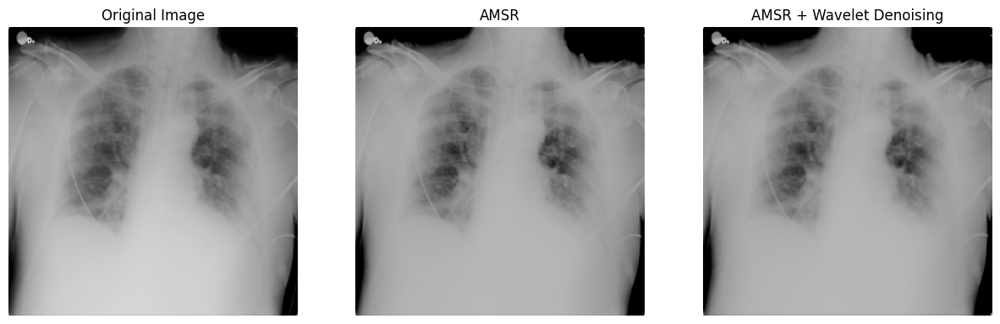

PSNR for COVID-09.png (AMSR): 28.05 dB
PSNR for COVID-09.png (AMSR + Wavelet Denoising): 26.19 dB


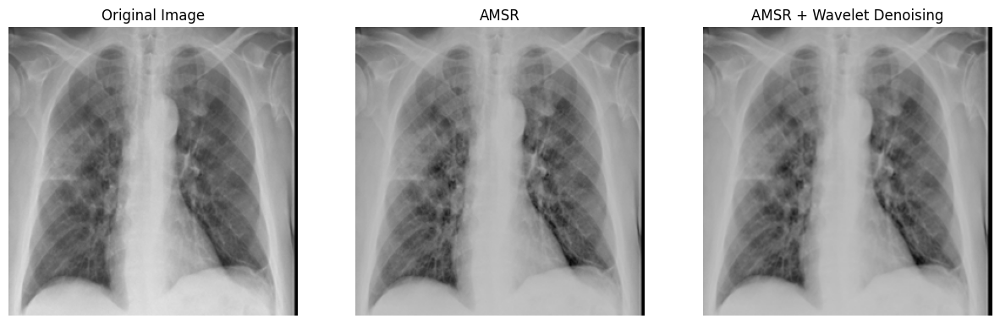

PSNR for COVID-10.png (AMSR): 20.40 dB
PSNR for COVID-10.png (AMSR + Wavelet Denoising): 20.18 dB


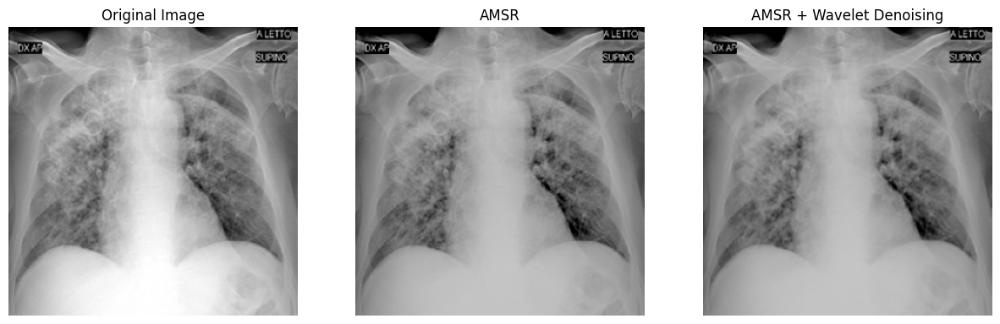

PSNR for Normal-01.png (AMSR): 23.42 dB
PSNR for Normal-01.png (AMSR + Wavelet Denoising): 23.21 dB


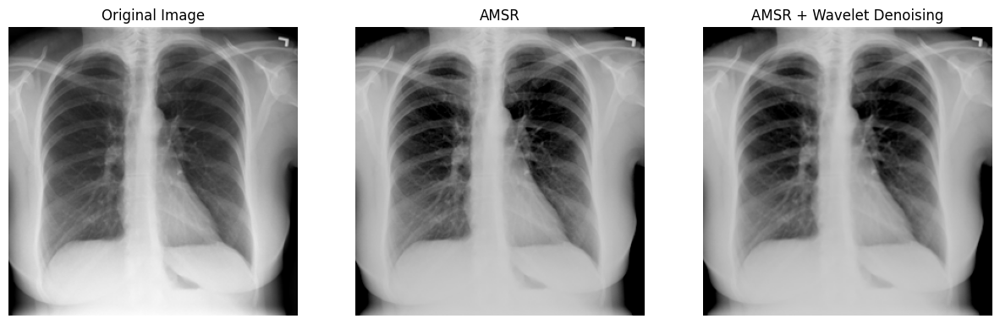

PSNR for Normal-02.png (AMSR): 21.95 dB
PSNR for Normal-02.png (AMSR + Wavelet Denoising): 21.83 dB


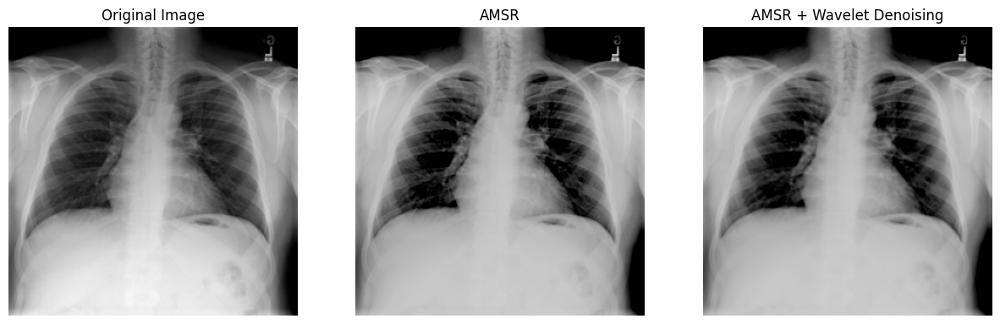

PSNR for Normal-03.png (AMSR): 18.65 dB
PSNR for Normal-03.png (AMSR + Wavelet Denoising): 18.64 dB


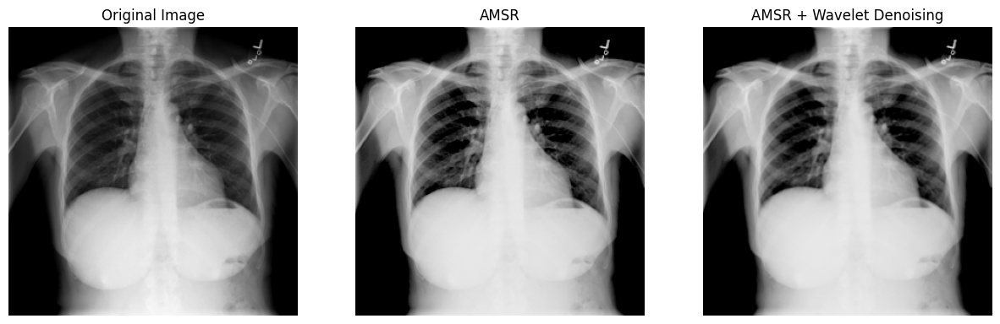

PSNR for Normal-04.png (AMSR): 23.30 dB
PSNR for Normal-04.png (AMSR + Wavelet Denoising): 23.16 dB


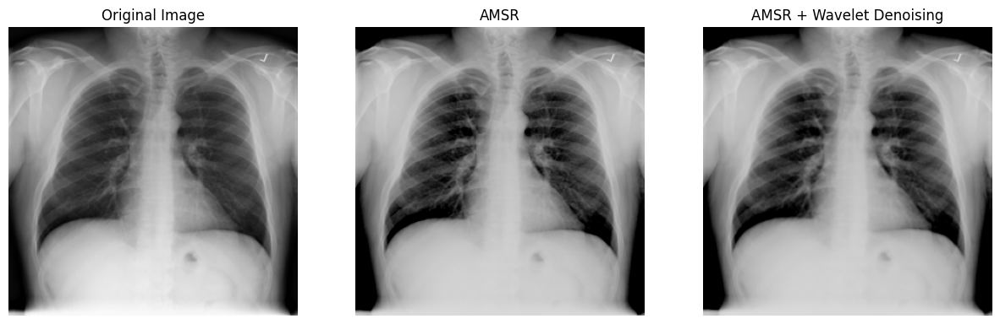

PSNR for Normal-05.png (AMSR): 21.14 dB
PSNR for Normal-05.png (AMSR + Wavelet Denoising): 21.03 dB


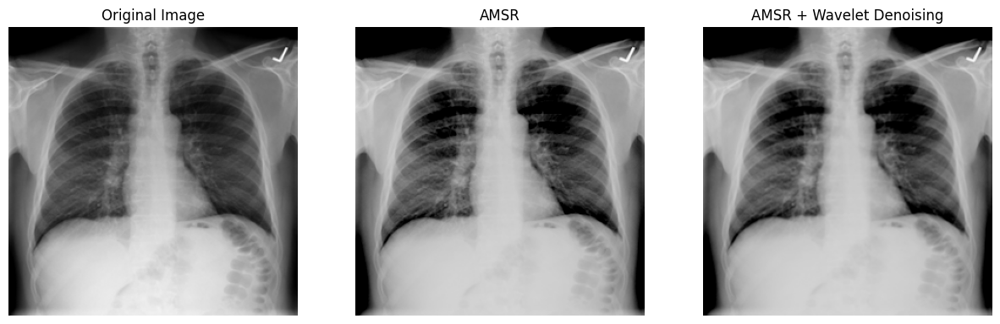

PSNR for Normal-06.png (AMSR): 20.50 dB
PSNR for Normal-06.png (AMSR + Wavelet Denoising): 20.42 dB


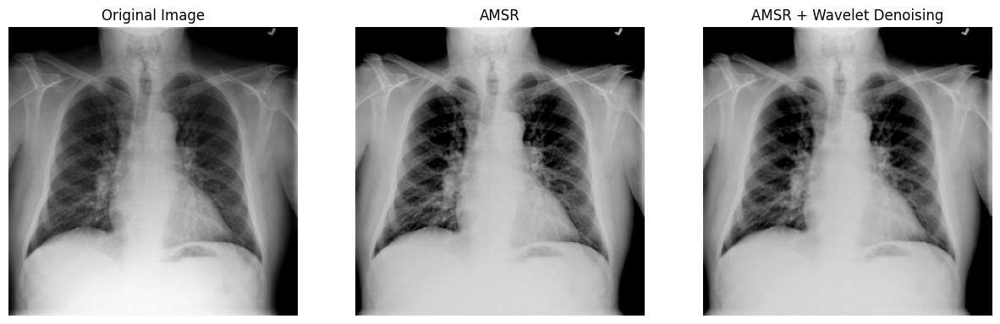

PSNR for Normal-07.png (AMSR): 21.84 dB
PSNR for Normal-07.png (AMSR + Wavelet Denoising): 21.69 dB


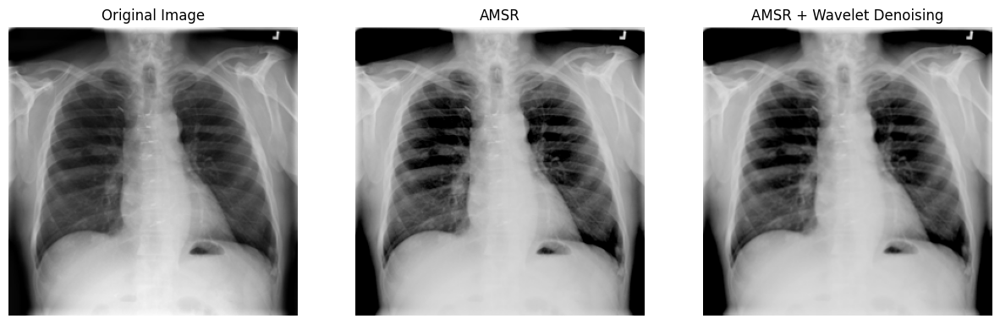

PSNR for Normal-08.png (AMSR): 20.77 dB
PSNR for Normal-08.png (AMSR + Wavelet Denoising): 20.72 dB


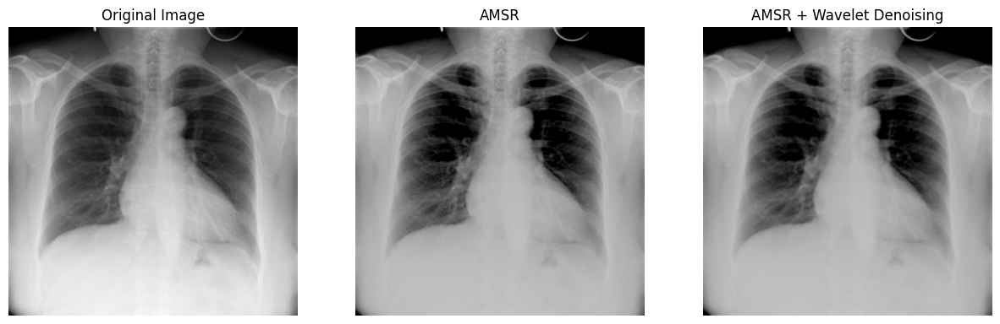

PSNR for Normal-09.png (AMSR): 17.74 dB
PSNR for Normal-09.png (AMSR + Wavelet Denoising): 17.74 dB


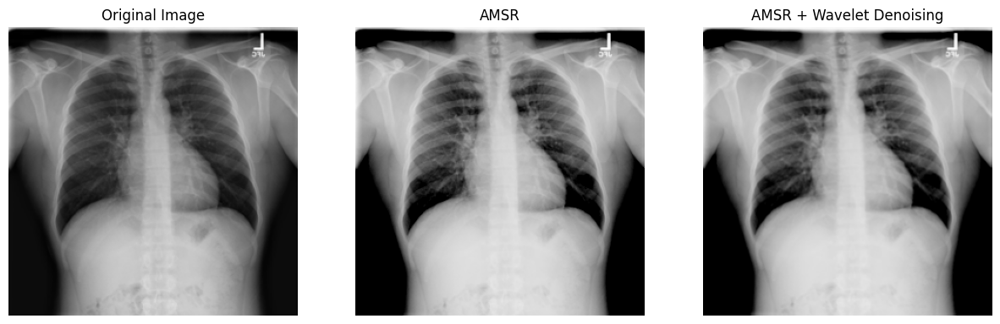

PSNR for Normal-20.png (AMSR): 19.88 dB
PSNR for Normal-20.png (AMSR + Wavelet Denoising): 19.70 dB


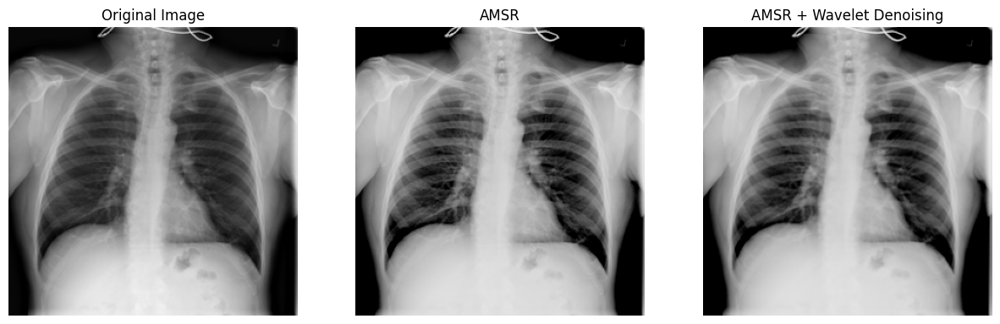

In [14]:
# Memproses setiap gambar dalam direktori
for image_path in glob.glob(os.path.join(input_dir, '*.png')):  # atau '*.png' sesuai dengan ekstensi file Anda
    # Membaca gambar
    image = cv2.imread(image_path)

    # Terapkan AMSR terlebih dahulu
    image_amsr = apply_amsr(image)

    # Terapkan Wavelet Denoising setelah AMSR
    image_amsr_wavelet = wavelet_denoising(image_amsr)

    # Resize processed images to match original image size
    image_amsr = cv2.resize(image_amsr, (image.shape[1], image.shape[0]))
    image_amsr_wavelet = cv2.resize(image_amsr_wavelet, (image.shape[1], image.shape[0]))

    # Convert processed images to RGB to match the original image shape, only if they are not already in BGR format
    if len(image_amsr.shape) == 2:  # Check if the image is grayscale
        image_amsr = cv2.cvtColor(image_amsr, cv2.COLOR_GRAY2BGR)
    if len(image_amsr_wavelet.shape) == 2:  # Check if the image is grayscale
        image_amsr_wavelet = cv2.cvtColor(image_amsr_wavelet, cv2.COLOR_GRAY2BGR)

    # Menyimpan hasil gambar
    base_name = os.path.basename(image_path)
    amsr_path = os.path.join(output_dir, f'amsr_{base_name}')
    amsr_wavelet_path = os.path.join(output_dir, f'amsr_wavelet_{base_name}')

    cv2.imwrite(amsr_path, image_amsr)
    cv2.imwrite(amsr_wavelet_path, image_amsr_wavelet)

    # Hitung PSNR
    psnr_amsr = calculate_psnr(image, image_amsr)
    psnr_amsr_wavelet = calculate_psnr(image, image_amsr_wavelet)

    # Tampilkan PSNR
    print(f'PSNR for {base_name} (AMSR): {psnr_amsr:.2f} dB')
    print(f'PSNR for {base_name} (AMSR + Wavelet Denoising): {psnr_amsr_wavelet:.2f} dB')
    
    # Tampilkan gambar dengan urutan yang diubah (Original, AMSR, AMSR + Wavelet Denoising)
    display_images_3col(image, image_amsr, image_amsr_wavelet, title1='AMSR', title2='AMSR + Wavelet Denoising')